In [1]:
# WITH JITTER ATE RESULTS

In [2]:
from misc_codes.general_settings import *
import re
import pandas as pd
import datetime
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
input_path = r"C:\Users\ccayno\OneDrive - Power Integrations\Wireless\FOD\11 - ATE Optimized"
output_filename = "summary.xlsx"
output_path = input_path + '/' + output_filename

In [4]:
excel_files_list = GENERAL_FUNCTIONS().EXCEL_FILES_LIST(input_path)
excel_files_list = sorted(excel_files_list, key=lambda x: int(re.findall(r'\d+', x)[0]))
print(excel_files_list)
excel_file_list_without_ext = [os.path.splitext(file)[0] for file in excel_files_list]
selected_labels_ref = [file for file in excel_file_list_without_ext]
print(selected_labels_ref)

['90 Vac , Optimized Resonant Cap.xlsx', '95Vac, Optimized Resonant Cap.xlsx', '97Vac, Optimized Resonant Cap.xlsx', '100Vac, Optimized Resonant Cap.xlsx', '110Vac , Optimized Resonant Cap.xlsx', '113Vac, Optimized Resonant Cap.xlsx', '115Vac , Optimized Resonant Cap.xlsx', '120Vac , Optimized Resonant Cap.xlsx', '123Vac, Optimized Resonant Cap.xlsx', '125Vac, Optimized Resonant Cap.xlsx', '127Vac, Optimized Resonant Cap.xlsx', '130Vac, Optimized Resonant Cap.xlsx', '132 Vac, Optimized Resonant Cap.xlsx']
['90 Vac , Optimized Resonant Cap', '95Vac, Optimized Resonant Cap', '97Vac, Optimized Resonant Cap', '100Vac, Optimized Resonant Cap', '110Vac , Optimized Resonant Cap', '113Vac, Optimized Resonant Cap', '115Vac , Optimized Resonant Cap', '120Vac , Optimized Resonant Cap', '123Vac, Optimized Resonant Cap', '125Vac, Optimized Resonant Cap', '127Vac, Optimized Resonant Cap', '130Vac, Optimized Resonant Cap', '132 Vac, Optimized Resonant Cap']


In [5]:
def convert_timestamp_to_minutes(df):
    def convert_to_seconds(serial_number):
        if pd.isnull(serial_number):
            return None

        if isinstance(serial_number, int) or isinstance(serial_number, float):
            # Handle serial_number as a numeric value representing days
            seconds = serial_number * 24 * 60 * 60
            return int(seconds)  # Convert to seconds

        if isinstance(serial_number, datetime.datetime):
            # Handle serial_number as a datetime object
            time_delta = pd.to_timedelta(serial_number)
            seconds = time_delta.total_seconds()
            return int(seconds)  # Convert to seconds

        if isinstance(serial_number, datetime.time):
            # Handle serial_number as a time object
            serial_number_str = serial_number.strftime('%H:%M:%S')
            time_parts = serial_number_str.split(':')
            hours = int(time_parts[0])
            minutes = int(time_parts[1])
            seconds = int(time_parts[2])
            total_seconds = (hours * 60 * 60) + (minutes * 60) + seconds
            return total_seconds

        if isinstance(serial_number, str):
            # Handle serial_number as a string representation of a time value (e.g., '12:30')
            time_parts = serial_number.split(':')
            if len(time_parts) == 3:
                hours = int(time_parts[0])
                minutes = int(time_parts[1])
                seconds = int(time_parts[2])
                total_seconds = (hours * 60 * 60) + (minutes * 60) + seconds
                return total_seconds

        return None  # Invalid serial_number format

    def calculate_time_difference(row):
        if row['Time (s)'] >= 0:
            return row['Time (s)']
        else:
            return row['Time (s)'] + 24 * 60 * 60 if pd.notnull(row['Time (s)']) else None

    # Convert 'Timestamp' to seconds and create 'Time (s)' column
    df['Time (s)'] = df['Timestamp'].apply(convert_to_seconds)

    # Replace None values with a default value (e.g., 0)
    df['Time (s)'].fillna(0, inplace=True)

    # Calculate the interval as the cumulative sum of the differences between consecutive rows
    df['Time (s)'] = df['Time (s)'].diff().cumsum()

    # Handle day transition by adding 24 hours (24 * 60 * 60 seconds) to negative time differences
    df['Time (s)'] = df.apply(calculate_time_difference, axis=1)

    df.loc[0, 'Time (s)'] = 0  # Set the first row of 'Time (s)' column to 0

    # Convert 'Time (s)' to minutes and create 'Time (mins)' column
    df['Time (mins)'] = df['Time (s)'] / 60

    return df




def convert_hz_to_khz(df, column_name):
    # Convert Hz to kHz
    df['Fsw (kHz)'] = df[column_name] / 1000

    return df

def convert_CHS_to_SOC(df, column_name):
    # Convert CHS to SOC
    df['SOC (%)'] = df[column_name] * 100 / 256

    return df

def generate_comms_status(df):
    df['Comms Status'] = df['Toggle RMS'].apply(lambda x: 1 if x > 2 else 0)
    return df

def add_comms_count(df):
    df['COMMS_COUNT'] = df['TROUGH'] + df['PEAK']
    return df

In [6]:
dataframes = {}

for file in excel_files_list:
    print(f"Dataframe for {file} already captured.")
    file_path = os.path.join(input_path, file)
    df = pd.read_excel(file_path)

    # dataframe manipulation functions
    convert_timestamp_to_minutes(df)
    convert_hz_to_khz(df, column_name='Fsw Frequency')
    convert_CHS_to_SOC(df, column_name='CHS')
    generate_comms_status(df)
    add_comms_count(df)
    
    dataframes[file] = df

dfs = [dataframes[file] for file in excel_files_list]
selected_labels = selected_labels_ref

Dataframe for 90 Vac , Optimized Resonant Cap.xlsx already captured.
Dataframe for 95Vac, Optimized Resonant Cap.xlsx already captured.
Dataframe for 97Vac, Optimized Resonant Cap.xlsx already captured.
Dataframe for 100Vac, Optimized Resonant Cap.xlsx already captured.
Dataframe for 110Vac , Optimized Resonant Cap.xlsx already captured.
Dataframe for 113Vac, Optimized Resonant Cap.xlsx already captured.
Dataframe for 115Vac , Optimized Resonant Cap.xlsx already captured.
Dataframe for 120Vac , Optimized Resonant Cap.xlsx already captured.
Dataframe for 123Vac, Optimized Resonant Cap.xlsx already captured.
Dataframe for 125Vac, Optimized Resonant Cap.xlsx already captured.
Dataframe for 127Vac, Optimized Resonant Cap.xlsx already captured.
Dataframe for 130Vac, Optimized Resonant Cap.xlsx already captured.
Dataframe for 132 Vac, Optimized Resonant Cap.xlsx already captured.


In [15]:
dfdf = dataframes[excel_files_list[7]]
filtered_df = dfdf[(dfdf['Time (mins)'] <= 20) & (dfdf['Time (mins)'] >= 0)]

print(filtered_df)
print(f"Min Vo = {filtered_df['Vo (V)'].min():.2f} V")
print(f"Min Fsw = {filtered_df['Fsw (kHz)'].min():.2f} kHz")

     Timestamp  CC (A)  Vin (rms)  Freq (Hz)  Vac (VAC)  Iin (A)  Pin (W)  \
0     0.371865     2.9        120         60     119.95  0.05529    1.295   
1     0.371893     2.9        120         60     119.95  0.05574    1.318   
2     0.371917     2.9        120         60     119.95  0.05517    1.278   
3     0.371945     2.9        120         60     119.95  0.05564    1.311   
4     0.371979     2.9        120         60     119.89  0.90910   45.000   
..         ...     ...        ...        ...        ...      ...      ...   
298   0.385509     2.9        120         60     119.85  1.36600   71.580   
299   0.385566     2.9        120         60     119.85  1.37410   72.070   
300   0.385623     2.9        120         60     119.85  1.37220   71.950   
301   0.385695     2.9        120         60     119.85  1.36150   71.310   
302   0.385752     2.9        120         60     119.85  1.37790   72.290   

         PF  THD (%)  Vo (V)  ...  I_Tx_Coil RMS  I_Tx_Coil Frequency  \
0 

In [8]:
def PLOT_DF_X_VS_YPRI_YSEC(dfs, x_col, y_col_pri, y_col_sec, ymax_pri, ymin_pri, ymax_sec, ymin_sec, xmax, xmin, y_color_pri, y_color_sec, selected_labels=None):
    fig, ax1 = plt.subplots()

    for i, df in enumerate(dfs):
        name_list = selected_labels_ref
        label = name_list[i]

        if selected_labels is None or label in selected_labels:
            # PRIMARY Y-AXIS
            ax1.plot(df[x_col], df[y_col_pri], label=label, color=y_color_pri)
            ax1.set_xlabel(x_col)
            ax1.set_ylabel(y_col_pri, color=y_color_pri)
            ax1.grid(True, linestyle=':', linewidth=0.5)
        
            ax1.set_ylim(bottom = ymin_pri)
            ax1.set_ylim(top = ymax_pri)
            ax1.set_xlim(left=xmin, right=xmax)

            # SECONDARY Y-AXIS
            ax2 = ax1.twinx()
            
            ax2.plot(df[x_col], df[y_col_sec], label=label, color=y_color_sec)
            ax2.set_ylabel(y_col_sec, color=y_color_sec)
            ax2.grid(True, linestyle=':', linewidth=0.5)
        
            ax2.set_ylim(bottom = ymin_sec)
            ax2.set_ylim(top = ymax_sec)
            ax2.set_xlim(left=xmin, right=xmax)
            
            plt.title(f'{y_col_pri} vs {y_col_sec} at {label}')
    
    plt.show()

In [9]:
def plot_data_for_fix_x_vs_ypri_and_ysec(dfs, selected_labels, x_col, xmax, xmin, plot_configs):
    for config in plot_configs:
        y_col_pri = config['y_col_pri']
        ymax_pri = config['ymax_pri']
        ymin_pri = config['ymin_pri']
        y_color_pri = config['y_color_pri']

        y_col_sec = config['y_col_sec']
        ymax_sec = config['ymax_sec']
        ymin_sec = config['ymin_sec']
        y_color_sec = config['y_color_sec']

        for label in selected_labels:
            label_list = [label]
            PLOT_DF_X_VS_YPRI_YSEC(dfs, x_col, y_col_pri, y_col_sec, ymax_pri, ymin_pri, ymax_sec, ymin_sec, xmax, xmin, y_color_pri, y_color_sec, label_list)

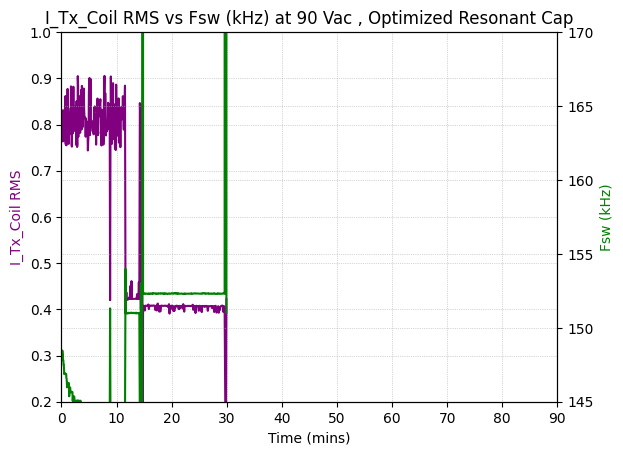

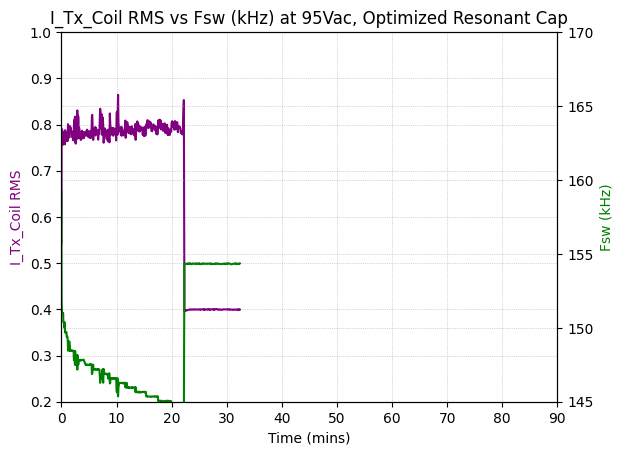

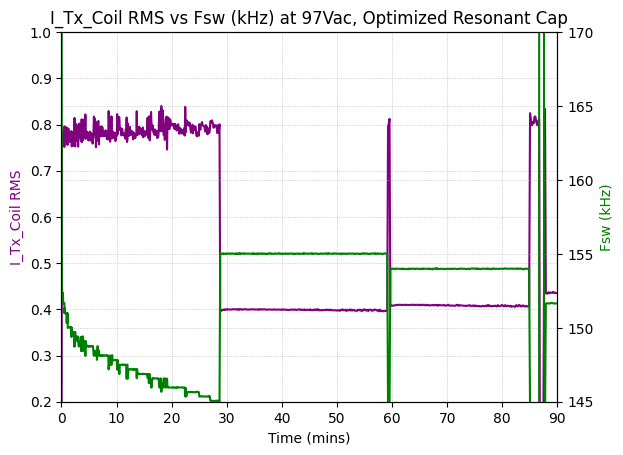

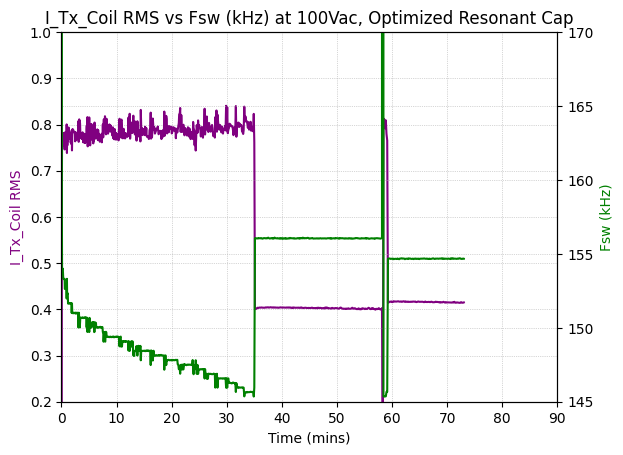

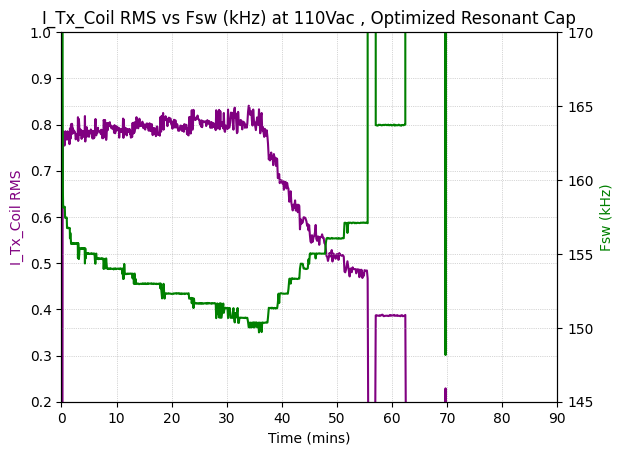

...

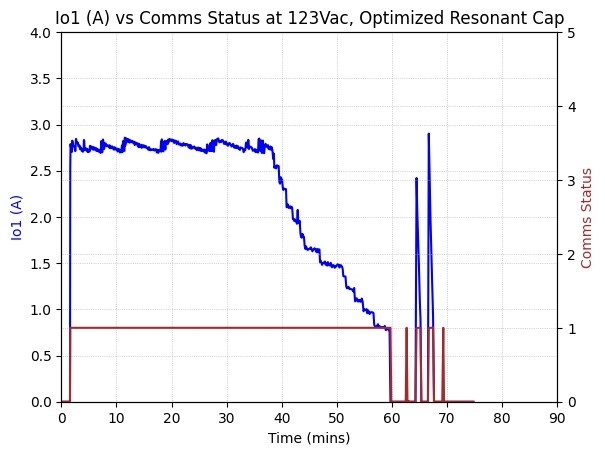

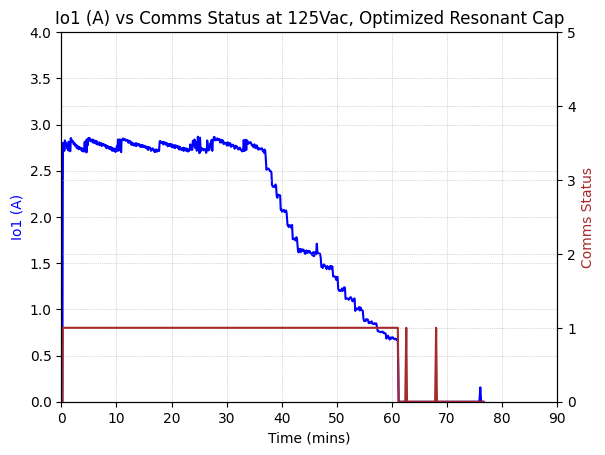

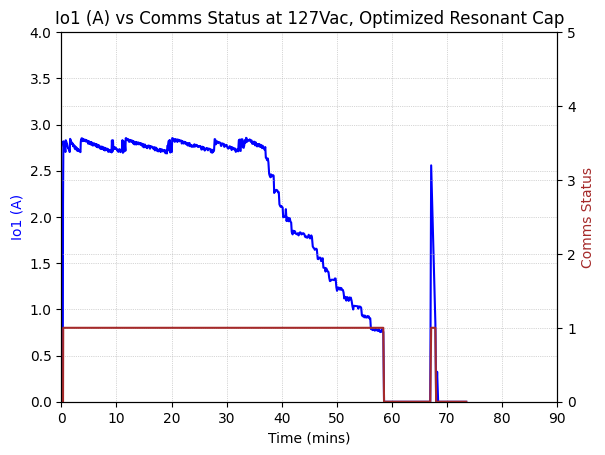

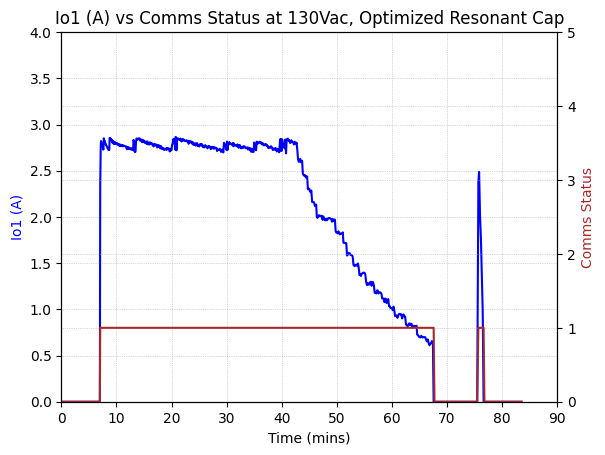

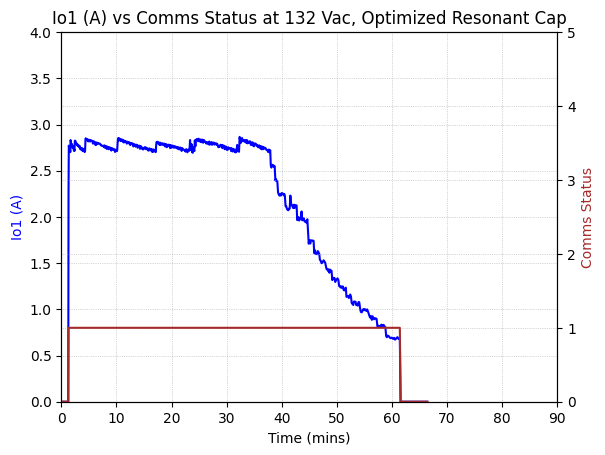

In [10]:
x_col = 'Time (mins)'
xmax = 90
xmin = 0

y_axis_plot_configs = [
    {
        'y_col_pri': 'I_Tx_Coil RMS',
        'ymax_pri': 1,
        'ymin_pri': 0.2,
        'y_color_pri': 'purple',
        'y_col_sec': 'Fsw (kHz)',
        'ymax_sec': 170,
        'ymin_sec': 145,
        'y_color_sec': 'green'
    },
    {
        'y_col_pri': 'Fsw (kHz)',
        'ymax_pri': 200,
        'ymin_pri': 100,
        'y_color_pri': 'green',
        'y_col_sec': 'Comms Status',
        'ymax_sec': 5,
        'ymin_sec': 0,
        'y_color_sec': 'brown'
    },
    {
        'y_col_pri': 'Io1 (A)',
        'ymax_pri': 4,
        'ymin_pri': 0,
        'y_color_pri': 'blue',
        'y_col_sec': 'Fsw (kHz)',
        'ymax_sec': 170,
        'ymin_sec': 145,
        'y_color_sec': 'green'
    },
    {
        'y_col_pri': 'Io1 (A)',
        'ymax_pri': 4,
        'ymin_pri': 0,
        'y_color_pri': 'blue',
        'y_col_sec': 'Vo (V)',
        'ymax_sec': 26,
        'ymin_sec': 18,
        'y_color_sec': 'red'
    },
    {
        'y_col_pri': 'Io1 (A)',
        'ymax_pri': 4,
        'ymin_pri': 0,
        'y_color_pri': 'blue',
        'y_col_sec': 'Comms Status',
        'ymax_sec': 5,
        'ymin_sec': 0,
        'y_color_sec': 'brown'
    },
    # Add more dictionaries for additional sets of data
]

plot_data_for_fix_x_vs_ypri_and_ysec(dfs, selected_labels, x_col, xmax, xmin, y_axis_plot_configs)

In [11]:
def PLOT_DF_X_VS_YPRI(dfs, x_col, y_col, ymax, ymin, xmax, xmin, selected_labels=None):
    fig, ax1 = plt.subplots()

    for i, df in enumerate(dfs):
        name_list = selected_labels_ref
        label = name_list[i]
        
        if selected_labels is None or label in selected_labels:
            ax1.plot(df[x_col], df[y_col], label=label)
            ax1.set_xlabel(x_col)
            ax1.set_ylabel(y_col, color='black')
            
            ax1.grid(True, linestyle=':', linewidth=0.5)

            plt.title(f'{y_col}')
            
            # Set the labels and limits for the axes
            # ax1.legend(loc='upper right')
            ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
            ax1.set_ylim(bottom=ymin, top=ymax)
            ax1.set_xlim(left=xmin, right=xmax)

    plt.show()

In [12]:
def PLOT_X_TO_MULTIPLE_Y_AXIS(excel_files_list,  xmax, xmin, x_col, ymax, ymin, y_col, selected_labels):
    """
        excel_files_list: list of excel files that contains the your data
        
        xmax: maximum x-axis limit on chart
        xmin: minimum x-axis limit on chart
        x_col: x-axis column reference

        ymax: maximum y-axis limit on chart
        ymin: minimum y-axis limit on chart
        y_col: y-axis column reference

        selected_labels: if only specific portion portion is selected, this is the filter

        Notes: dataframes is a global variable
    """
    dfs = [dataframes[file] for file in excel_files_list]
    
    ## PLOTTING GROUP PLOT
    PLOT_DF_X_VS_YPRI(dfs, x_col, y_col, ymax, ymin, xmax, xmin, selected_labels)
    
    ## PLOTTING INDIVIDUAL PLOTS
    for label in selected_labels:
        label_list = [label]
        PLOT_DF_X_VS_YPRI(dfs, x_col, y_col, ymax, ymin, xmax, xmin, label_list)

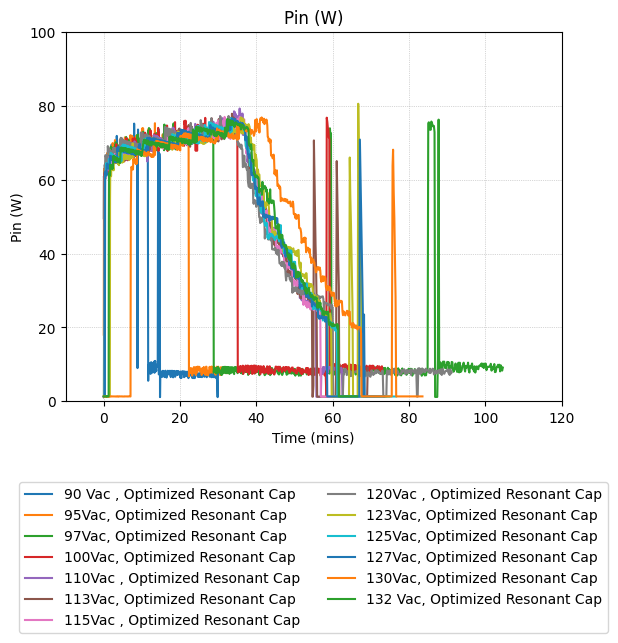

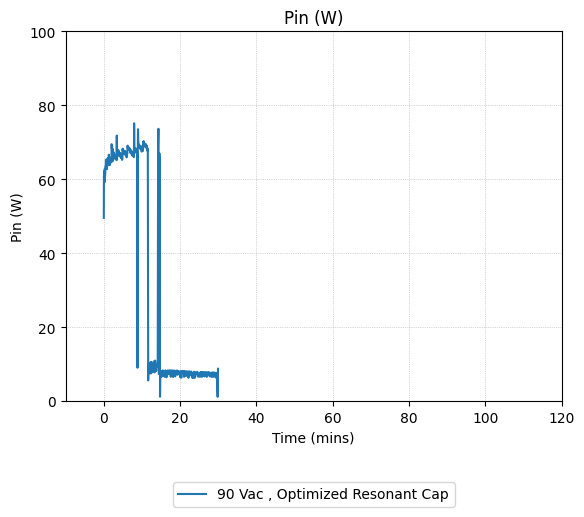

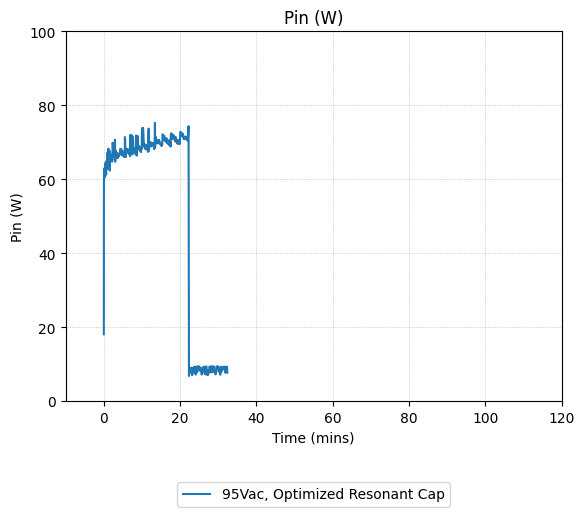

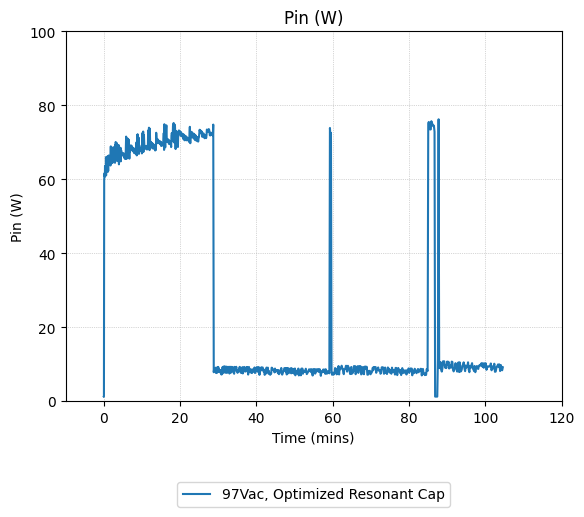

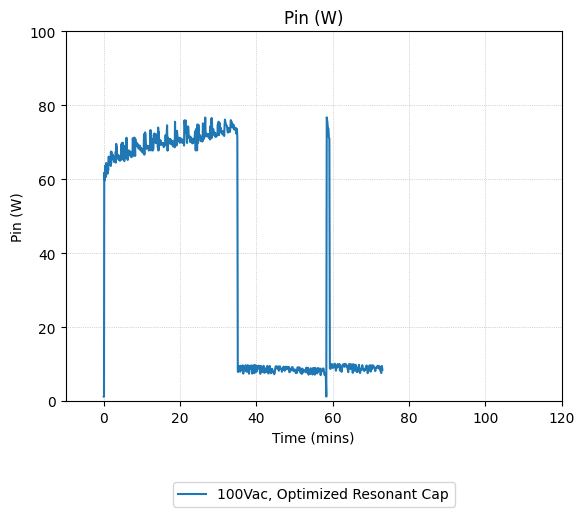

...

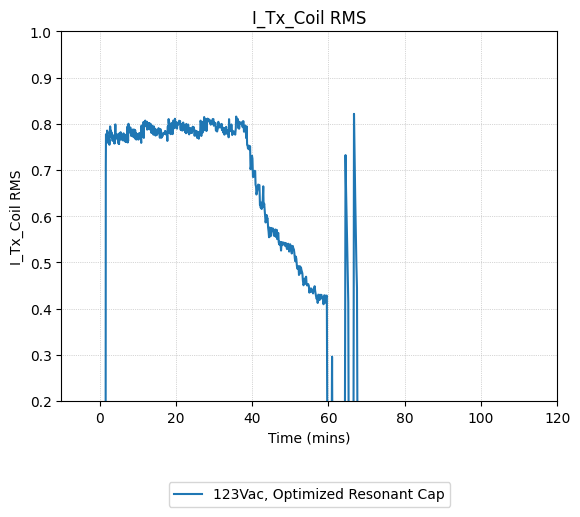

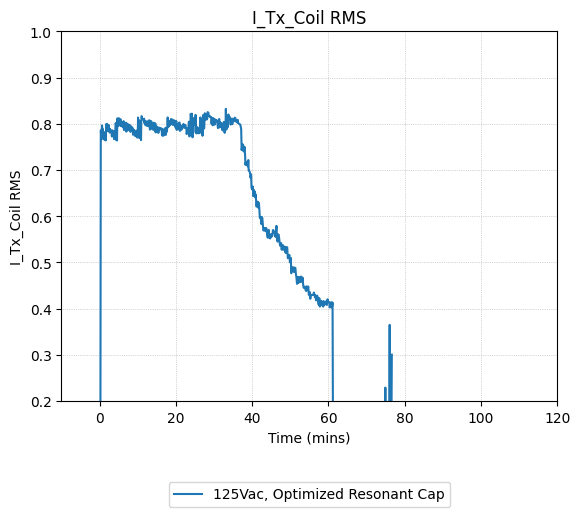

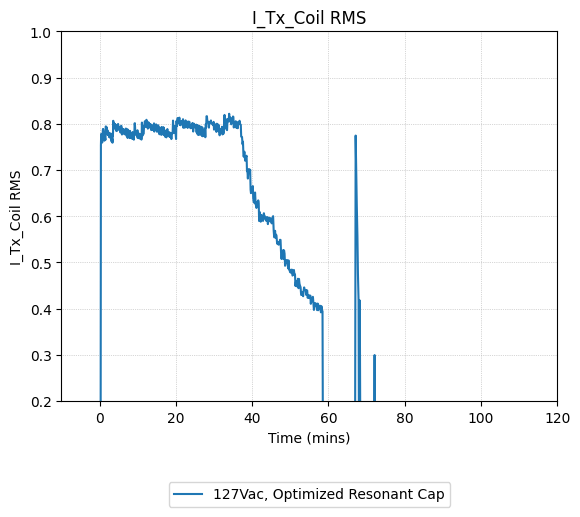

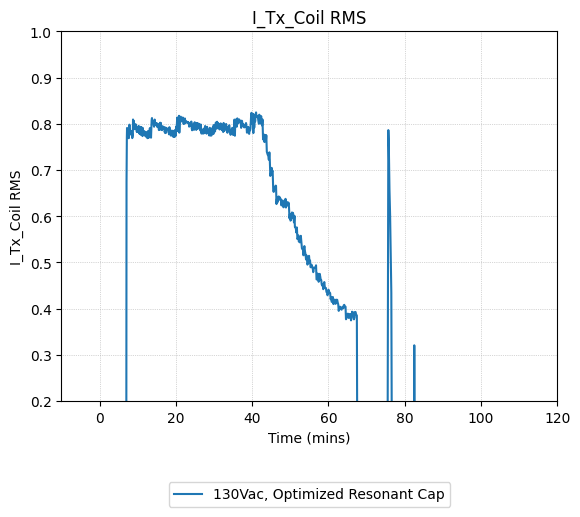

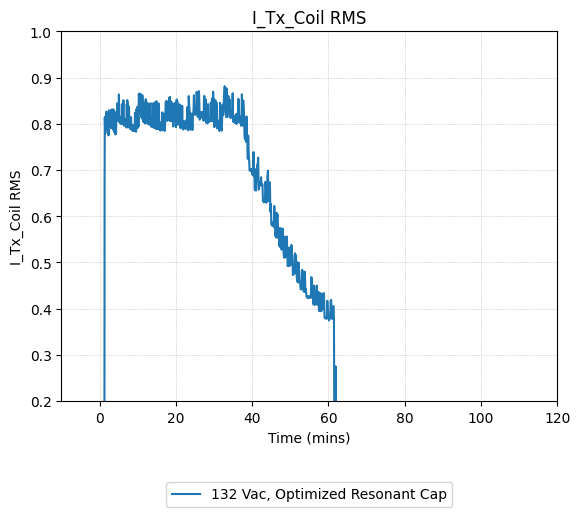

In [13]:
## FUNCTION USAGE OF "PLOT_X_TO_MULTIPLE_Y_AXIS"

xmax = 120
xmin = -10
x_col = 'Time (mins)'

data = [
    ( 'Pin (W)', (100, 0) ),
    ( 'COMMS_COUNT', (10, 0) ),
    ( 'Fsw (kHz)', (195, 115) ),
    ( 'Eff (%)', (95, 80) ),
    ( 'Vo (V)', (26, 18) ),
    ( 'Io1 (A)', (4, 0) ),
    ( 'CHS', (300, 0) ),
    ( 'CE', (10, 0) ), 
    ( 'PF', (0.5, 0.25) ),
    ( 'THD (%)', (250, 150) ),
    ( 'Po (W)', (90, 0) ),
    ( 'DUTY_HOLDER', (300, 0) ),
    ( 'I_Tx_Coil Max', (1.3, 0) ),
    ( 'I_Tx_Coil Peak to peak', (5, 0) ),
    ( 'I_Tx_Coil RMS', (1, 0.2) )
]

for y_col, (ymax, ymin) in data:
    PLOT_X_TO_MULTIPLE_Y_AXIS(excel_files_list, xmax, xmin, x_col, ymax, ymin, y_col, selected_labels=selected_labels_ref)